# Scraping Twitter Data

In [ ]:
!pip install snscrape

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# importing libraries and packages
import snscrape.modules.twitter as sntwitter
import pandas as pd
from tqdm import tqdm
import re

In [ ]:
# Creating list to append tweet data 
tweets_list1 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in tqdm(enumerate(sntwitter.TwitterSearchScraper('#immigrant -filter:retweets').get_items())):
    # if i>100000: #number of tweets you want to scrape
    #     break
    # tweets_list1.append(tweet)
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.username]) #declare the attributes to be returned

In [ ]:
# Creating a dataframe from the tweets list above 
actual_tweets_df = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

In [ ]:
actual_tweets_df.to_csv('tweets_actual.csv')

In [ ]:
actual_tweets_df.head()

In [ ]:
actual_tweets_df.describe()

# Sentiment Analysis

In [ ]:
# Upload Tweet Data
from google.colab import files
uploaded = files.upload()

Saving cloud.png to cloud.png


In [ ]:
# importing custom filters for the gensim 
import gensim.parsing.preprocessing as gsp

In [ ]:
# comment this if you want to reproduce
actual_tweets_df = pd.read_csv('tweets_actual.csv', index_col = 0, lineterminator='\n')

In [ ]:
#define custom filters 
CUSTOM_FILTERS = [lambda x: x.lower(),
                  lambda x: re.sub('@[\w]+','',x), #remove mentions
                  lambda x: re.sub("https?:\/\/\S*","",x), # remove links
                  gsp.strip_multiple_whitespaces, #remove whitespaces
                  gsp.strip_numeric, #remove numbers
                  #gsp.remove_stopwords, #remove stopwords
                  ]

def clean_text (s):
  for f in CUSTOM_FILTERS:
    s = f(s)
  return s
# uncomment these if you want to reproduce
actual_tweets_df["Clean_text"] = actual_tweets_df["Text"]
actual_tweets_df["Clean_text"] = actual_tweets_df["Clean_text"].apply(lambda row : clean_text(row))

In [ ]:
actual_tweets_df.head()

,Datetime,Tweet Id,Text,Username,Clean_text,Sentiment_score,Sentiment
0,2022-10-31 09:29:19+00:00,1587013840818020353,Forecast that #Channel #immigrant numbers coul...,chesterwriter,forecast that #channel #immigrant numbers coul...,0.3094,1
1,2022-10-31 07:44:04+00:00,1586987352265994240,Well written and difficult to put down. Grab a...,author2authors,well written and difficult to put down. grab a...,-0.2732,-1
2,2022-10-31 07:10:49+00:00,1586978984318758912,@NewbieBadASS That’s called #Depression my fri...,RayRedd1ngt0n,"that’s called #depression my friend, especial...",-0.0644,-1
3,2022-10-31 06:05:09+00:00,1586962460539424768,I cried the first time I could vote. I’m not a...,beckbeat,i cried the first time i could vote. i’m not a...,-0.2023,-1
4,2022-10-31 03:56:00+00:00,1586929959494451201,@educationweek @emilyfranESL Great article @Il...,MrAlvarezTeachr,great article on the #immigrant #journey... w...,0.7840,2


In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

In [ ]:
# uncomment these if you want to reproduce
actual_tweets_df["Sentiment_score"] = actual_tweets_df["Clean_text"].apply(lambda x: sia.polarity_scores(x)['compound'])

In [ ]:
actual_tweets_df.head()

,Datetime,Tweet Id,Text,Username,Clean_text,Sentiment_score,Sentiment
0,2022-10-31 09:29:19+00:00,1587013840818020353,Forecast that #Channel #immigrant numbers coul...,chesterwriter,forecast that #channel #immigrant numbers coul...,0.3094,1
1,2022-10-31 07:44:04+00:00,1586987352265994240,Well written and difficult to put down. Grab a...,author2authors,well written and difficult to put down. grab a...,-0.2732,-1
2,2022-10-31 07:10:49+00:00,1586978984318758912,@NewbieBadASS That’s called #Depression my fri...,RayRedd1ngt0n,"that’s called #depression my friend, especial...",-0.0644,-1
3,2022-10-31 06:05:09+00:00,1586962460539424768,I cried the first time I could vote. I’m not a...,beckbeat,i cried the first time i could vote. i’m not a...,-0.2023,-1
4,2022-10-31 03:56:00+00:00,1586929959494451201,@educationweek @emilyfranESL Great article @Il...,MrAlvarezTeachr,great article on the #immigrant #journey... w...,0.7840,2


In [ ]:
# uncomment these if you want to reproduce
actual_tweets_df["Sentiment"] = actual_tweets_df["Sentiment_score"]

In [ ]:
# uncomment these if you want to reproduce
actual_tweets_df["Sentiment"] = actual_tweets_df["Sentiment"].apply(lambda x: 2 if x>0.60 else (1 if x>0.20 else(0 if x>=0 else(-1 if x>-.60 else -2))))

In [ ]:
actual_tweets_df.head()

,Datetime,Tweet Id,Text,Username,Clean_text,Sentiment_score,Sentiment
0,2022-10-31 09:29:19+00:00,1587013840818020353,Forecast that #Channel #immigrant numbers coul...,chesterwriter,forecast that #channel #immigrant numbers coul...,0.3094,1
1,2022-10-31 07:44:04+00:00,1586987352265994240,Well written and difficult to put down. Grab a...,author2authors,well written and difficult to put down. grab a...,-0.2732,-1
2,2022-10-31 07:10:49+00:00,1586978984318758912,@NewbieBadASS That’s called #Depression my fri...,RayRedd1ngt0n,"that’s called #depression my friend, especial...",-0.0644,-1
3,2022-10-31 06:05:09+00:00,1586962460539424768,I cried the first time I could vote. I’m not a...,beckbeat,i cried the first time i could vote. i’m not a...,-0.2023,-1
4,2022-10-31 03:56:00+00:00,1586929959494451201,@educationweek @emilyfranESL Great article @Il...,MrAlvarezTeachr,great article on the #immigrant #journey... w...,0.7840,2


In [ ]:
actual_tweets_df["Sentiment"].value_counts()

 0    69017
 1    44833
-1    33777
 2    32448
-2    14981
Name: Sentiment, dtype: int64

In [ ]:
classification_tweets_df = actual_tweets_df[actual_tweets_df["Sentiment"] != 0]

In [ ]:
classification_tweets_df["Sentiment"].value_counts()

 1    44833
-1    33777
 2    32448
-2    14981
Name: Sentiment, dtype: int64

In [ ]:
import multiprocessing
import numpy as np

In [ ]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(classification_tweets_df, test_size = 0.2, random_state = 29)

In [ ]:
test_df.shape

(25208, 7)

In [ ]:
train_features = train_df["Clean_text"]
train_labels = train_df["Sentiment"]
test_features = test_df["Clean_text"]
test_labels = test_df["Sentiment"]

In [ ]:
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)

Training Features Shape: (100831,)
Training Labels Shape: (100831,)
Testing Features Shape: (25208,)
Testing Labels Shape: (25208,)


In [ ]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()

In [ ]:
encoded_train_labels = encoder.fit_transform(train_labels.values.reshape(-1,1)).toarray()
encoded_test_labels = encoder.fit_transform(test_labels.values.reshape(-1,1)).toarray()

In [ ]:
y_parts = [encoded_train_labels,encoded_test_labels]
for y_part in y_parts:
  re_transformed_array_trainY = encoder.inverse_transform(y_part)

  unique_elements, counts_elements = np.unique(re_transformed_array_trainY, return_counts=True)
  unique_elements_and_counts = pd.DataFrame(np.asarray((unique_elements, counts_elements)).T)
  unique_elements_and_counts.columns = ['unique_elements', 'count']
  print('---------------')
  print(unique_elements_and_counts)

---------------
   unique_elements  count
0               -2  11986
1               -1  26967
2                1  35911
3                2  25967
---------------
   unique_elements  count
0               -2   2995
1               -1   6810
2                1   8922
3                2   6481


# Classification

## Model Loading

In [ ]:
from sklearn.linear_model import LogisticRegression
import math
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError

In [ ]:
lr_model = LogisticRegression(multi_class='multinomial', solver='saga', max_iter=100)

In [ ]:
hidden_units1 = 160
hidden_units2 = 480
hidden_units3 = 256
learning_rate = 0.01

In [ ]:
# Creating model using the Sequential in tensorflow
def build_model_using_sequential():
  model = Sequential([
    Dense(hidden_units1, kernel_initializer='normal', activation='relu', input_shape= (4000,)),
    Dropout(0.2),
    Dense(hidden_units2, kernel_initializer='normal', activation='relu'),
    Dropout(0.2),
    Dense(hidden_units3, kernel_initializer='normal', activation='relu'),
    Dense(4, kernel_initializer='normal', activation='softmax')
  ])
  return model

In [ ]:
# build the model
ann_model = build_model_using_sequential()

In [ ]:
# loss function
msle = MeanSquaredLogarithmicError()
ann_model.compile(
    loss="mean_squared_error", 
    optimizer=Adam(learning_rate=learning_rate), 
    metrics=['accuracy']
)

## TF-IDF Vectorization

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
# uncomment these if you want to reproduce
tfidf_vectorizer = TfidfVectorizer(max_features = 4000)
tfidf_train_vectors = tfidf_vectorizer.fit_transform(train_features)

In [ ]:
import pickle
#save vectorizer
# uncomment this if you want to reproduce
pickle.dump(tfidf_vectorizer, open('tfidf_vectorizer.pickle', 'wb'))
#load vectorizer
# comment these if you want to reproduce
# tfidf_vectorizer = pickle.load(open('tfidf_vectorizer.pickle','rb'))

In [ ]:
tfidf_train_vectors = tfidf_vectorizer.transform(train_features)

In [ ]:
tfidf_train_vectors

<100831x4000 sparse matrix of type '<class 'numpy.float64'>'
	with 1633282 stored elements in Compressed Sparse Row format>

In [ ]:
tfidf_test_vectors = tfidf_vectorizer.transform(test_df["Clean_text"])

In [ ]:
tfidf_test_vectors

<25208x4000 sparse matrix of type '<class 'numpy.float64'>'
	with 408515 stored elements in Compressed Sparse Row format>

## Linear Regression Model Training


In [ ]:
import joblib
# load
# lr_model = joblib.load("/content/drive/MyDrive/twitter_logistic_regression.joblib")

In [ ]:
lr_model.fit(tfidf_train_vectors, train_labels)

LogisticRegression(multi_class='multinomial', solver='saga')

In [ ]:
lr_model.score(tfidf_test_vectors, test_labels)

0.7341716915264995

In [ ]:
pd.Series(lr_model.predict(tfidf_test_vectors)).value_counts()

 1    10008
-1     7190
 2     5884
-2     2126
dtype: int64

In [ ]:
# save
joblib.dump(lr_model, "/content/drive/MyDrive/twitter_logistic_regression.joblib")

['/content/drive/MyDrive/twitter_logistic_regression.joblib']

## ANN Classification Model

In [ ]:
from tensorflow import keras
# load model
# ann_model = keras.models.load_model('/content/drive/MyDrive/tweet_ann_model.h5')

In [ ]:
tfidf_train_features = tfidf_train_vectors.toarray()

In [ ]:
tfidf_train_features

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# train the model
history = ann_model.fit(
    tfidf_train_features, 
    encoded_train_labels, 
    epochs=10, 
    batch_size=64,
    validation_split=0.2)

Epoch 1/10
1261/1261 [==============================] - 12s 9ms/step - loss: 0.1103 - accuracy: 0.6700 - val_loss: 0.0962 - val_accuracy: 0.7205
Epoch 2/10
1261/1261 [==============================] - 11s 9ms/step - loss: 0.0815 - accuracy: 0.7729 - val_loss: 0.0932 - val_accuracy: 0.7407
Epoch 3/10
1261/1261 [==============================] - 12s 9ms/step - loss: 0.0662 - accuracy: 0.8208 - val_loss: 0.0906 - val_accuracy: 0.7506
Epoch 4/10
1261/1261 [==============================] - 12s 9ms/step - loss: 0.0546 - accuracy: 0.8559 - val_loss: 0.0928 - val_accuracy: 0.7495
Epoch 5/10
1261/1261 [==============================] - 12s 9ms/step - loss: 0.0466 - accuracy: 0.8792 - val_loss: 0.0941 - val_accuracy: 0.7475
Epoch 6/10
1261/1261 [==============================] - 12s 10ms/step - loss: 0.0408 - accuracy: 0.8953 - val_loss: 0.0995 - val_accuracy: 0.7508
Epoch 7/10
1261/1261 [==============================] - 12s 10ms/step - loss: 0.0366 - accuracy: 0.9061 - val_loss: 0.1002 - val_

In [ ]:
predictions = ann_model.predict(tfidf_test_vectors.toarray())

788/788 [==============================] - 2s 2ms/step


In [ ]:
predictions

array([[5.81417089e-06, 9.99993861e-01, 2.34387272e-07, 4.58879081e-11],
       [4.45892513e-02, 9.39150810e-01, 1.44933984e-02, 1.76638330e-03],
       [5.34052333e-31, 1.78535127e-34, 1.93761109e-04, 9.99806166e-01],
       ...,
       [1.90713797e-06, 8.16016745e-06, 9.99755621e-01, 2.34365536e-04],
       [1.19496405e-01, 7.99974620e-01, 6.41035810e-02, 1.64253749e-02],
       [1.57214380e-11, 4.39375841e-10, 9.99999821e-01, 1.10585667e-07]],
      dtype=float32)

In [ ]:
predictions_classes = []
for pred in predictions:
  if np.argmax(pred, axis=0) > 1:
    predictions_classes.append(np.argmax(pred, axis=0)-1)
  else:
    predictions_classes.append(np.argmax(pred, axis=0)-2)

In [ ]:
accuracy_score(test_labels,predictions_classes)

0.7489685814027293

In [ ]:
# save model
ann_model.save('/content/drive/MyDrive/tweet_ann_model.h5')

# Word Cloud Generation

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords as STOPWORDS

common_words = ["immigrant", "numbers", "now", "immigrants", "immigration", "help", "new", "great", "via"]
stopwords = set(STOPWORDS.words('english'))
stopwords.update(common_words)

In [ ]:
cv=CountVectorizer(stop_words= stopwords, analyzer='word', max_df=0.1, min_df=0.003)

In [ ]:
word_counts = cv.fit_transform(actual_tweets_df["Clean_text"])

In [ ]:
cv.get_feature_names_out()

array(['abuse', 'access', 'across', 'act', 'action', 'administration',
       'advocates', 'african', 'age', 'ago', 'aid', 'ainf', 'also',
       'always', 'amazing', 'america', 'american', 'americandream',
       'americans', 'among', 'another', 'anti', 'anyone', 'apply',
       'arizona', 'around', 'arrested', 'art', 'article', 'asian', 'ask',
       'asylum', 'attorney', 'author', 'available', 'award', 'away',
       'back', 'bad', 'badass', 'ban', 'based', 'beautiful', 'became',
       'become', 'behind', 'believe', 'benefits', 'best', 'better',
       'biden', 'big', 'bill', 'black', 'blog', 'book', 'border', 'born',
       'bosnian', 'boston', 'brave', 'breaking', 'brexit', 'bring',
       'british', 'build', 'building', 'business', 'businesses', 'ca',
       'california', 'call', 'called', 'came', 'campaign', 'canada',
       'canadian', 'card', 'care', 'career', 'case', 'cdnimm',
       'celebrate', 'center', 'centers', 'challenges', 'chance', 'change',
       'check', 'chicago

In [ ]:
word_counts_df = pd.DataFrame(word_counts.toarray(), columns= cv.get_feature_names_out())

In [ ]:
dict_all_tweets = word_counts_df.sum().to_dict()

In [ ]:
from wordcloud import WordCloud
from PIL import Image

def create_wordcloud(text, path):
  mask = np.array(Image.open("/content/drive/MyDrive/cloud.png"))
  wc = WordCloud(background_color="white",
  contour_color='purple',
  mask = mask,
  max_words=3000,
  stopwords=stopwords,
  contour_width=4)
  wc.generate_from_frequencies(text)
  wc.to_file(path)
  print("Word Cloud Saved Successfully")
  display(Image.open(path))

Word Cloud Saved Successfully


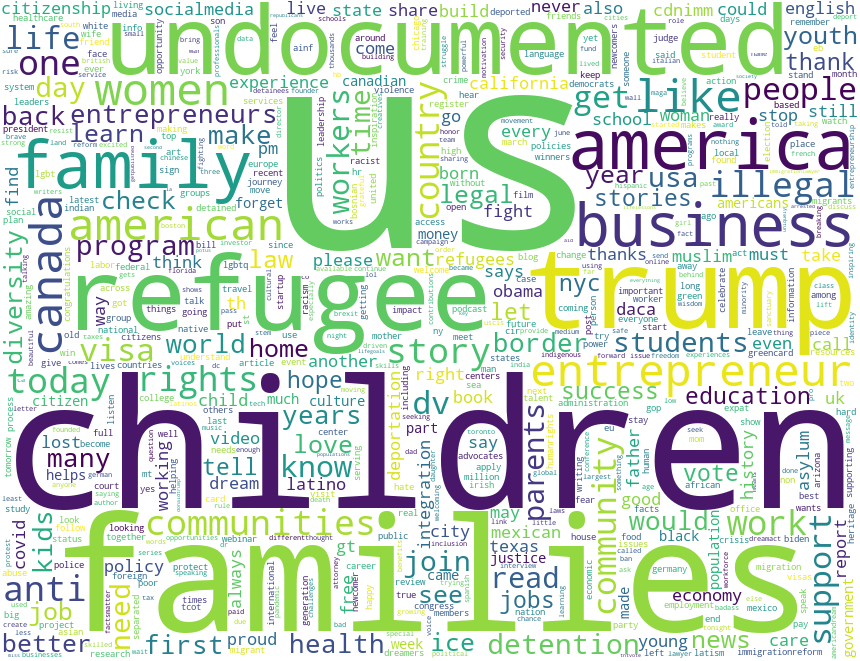

In [ ]:
#Creating wordcloud for all tweets
create_wordcloud(dict_all_tweets, "/content/drive/MyDrive/wc.png")

In [ ]:
positive_sentiment_df = actual_tweets_df[actual_tweets_df["Sentiment_score"] > 0.5]
negative_sentiment_df = actual_tweets_df[actual_tweets_df["Sentiment_score"] < -0.5]

In [ ]:
positive_sentiment_df

,Datetime,Tweet Id,Text,Username,Clean_text,Sentiment_score,Sentiment
4,2022-10-31 03:56:00+00:00,1586929959494451201,@educationweek @emilyfranESL Great article @Il...,MrAlvarezTeachr,great article on the #immigrant #journey... w...,0.7840,2
9,2022-10-31 00:42:15+00:00,1586881197757579264,#Uber. The ride. #Immigrant Yemenite driver. F...,OpticalBuddy,#uber. the ride. #immigrant yemenite driver. f...,0.7351,2
13,2022-10-30 21:05:11+00:00,1586826573910609921,Many healthcare barriers negatively affect the...,ShelaHirani,many healthcare barriers negatively affect the...,0.7003,2
17,2022-10-30 18:19:01+00:00,1586784756552724480,Author @emilyfranESL never forgot her journey ...,PRbytheBook,author never forgot her journey as an #immigra...,0.6705,2
30,2022-10-30 01:45:08+00:00,1586534636812787712,"Congrats to Sarvadzhon Khamidov(#Tajikistan),L...",GatitoInmeegran,"congrats to sarvadzhon khamidov(#tajikistan),l...",0.5267,1
...,...,...,...,...,...,...,...
195043,2010-01-05 02:49:41+00:00,7389327535,#immigrant Fast For Families blog by Jonathan ...,fastforfamilies,#immigrant fast for families blog by jonathan ...,0.6369,2
195044,2010-01-05 00:54:04+00:00,7385624500,http://bit.ly/5092kS #Immigrant #Scholarship: ...,nationalmecha,#immigrant #scholarship: application deadline...,0.5423,1
195048,2010-01-04 20:30:29+00:00,7377976003,Rich people are sweet http://www.nytimes.com/...,MissEBennett,rich people are sweet #cirasap #ria #immigrant...,0.7650,2
195049,2010-01-04 18:45:23+00:00,7375208522,Federal officials grant Calif. $12.5 mill for ...,skalantari,federal officials grant calif. $. mill for hea...,0.6369,2


In [ ]:
positive_word_counts = cv.fit_transform(positive_sentiment_df["Clean_text"])

In [ ]:
positive_word_counts_df = pd.DataFrame(positive_word_counts.toarray(), columns= cv.get_feature_names_out())

In [ ]:
dict_positive_tweets = positive_word_counts_df.sum().to_dict()

Word Cloud Saved Successfully


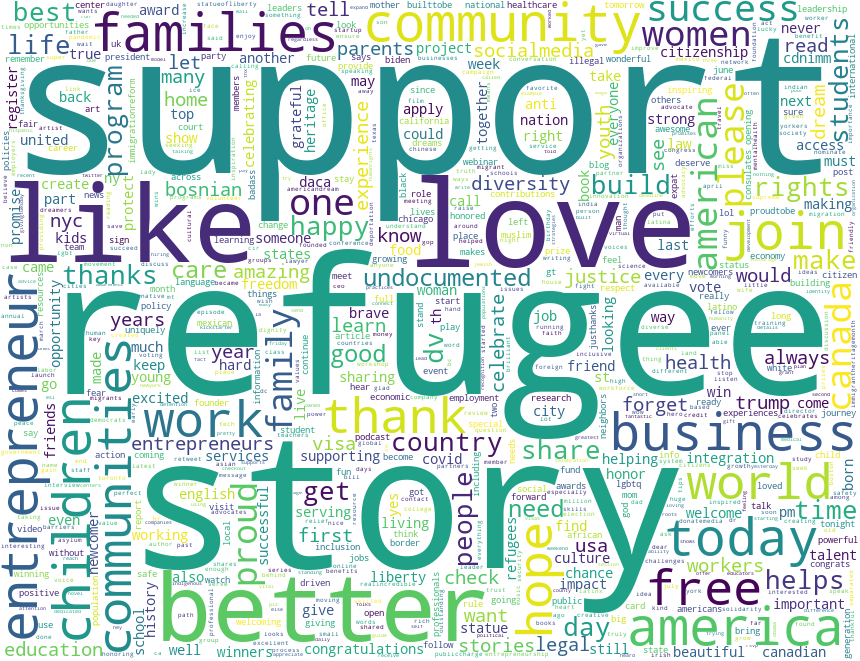

In [ ]:
create_wordcloud(dict_positive_tweets, "/content/drive/MyDrive/wc_positive.png")

In [ ]:
negative_sentiment_df

,Datetime,Tweet Id,Text,Username,Clean_text,Sentiment_score,Sentiment
12,2022-10-30 22:20:11+00:00,1586845447741530112,MT @rachelmsavage: The small #Quebec town of H...,friendsunaoc,mt : the small #quebec town of herouxville iss...,-0.5423,-1
20,2022-10-30 14:21:21+00:00,1586724945333309445,These #gentrifiers hate getting a taste of the...,PoliticalGame10,these #gentrifiers hate getting a taste of the...,-0.5719,-1
41,2022-10-29 07:55:31+00:00,1586265458805592065,An #immigrant #American @elonmusk \nstands up ...,namitverma,an #immigrant #american stands up for #world #...,-0.5719,-1
47,2022-10-28 22:41:03+00:00,1586125921357996032,Those poor women and children. What horrors th...,SidSnottingham,those poor women and children. what horrors th...,-0.7783,-2
48,2022-10-28 22:00:36+00:00,1586115742973317120,"@NatImmForum Unfortunately, there are often ma...",bruna_giovanni,"unfortunately, there are often many immigrant...",-0.9371,-2
...,...,...,...,...,...,...,...
195029,2010-01-07 16:05:41+00:00,7483104007,"NEW: #Orlando loses ""fierce"" #immigrant advoca...",vmramos,"new: #orlando loses ""fierce"" #immigrant advoca...",-0.7650,-2
195030,2010-01-07 16:03:06+00:00,7483024322,#Orlando-area loses #immigrant advocate: Siste...,hispanosphere,#orlando-area loses #immigrant advocate: siste...,-0.7650,-2
195039,2010-01-05 23:11:07+00:00,7419017236,Immigrant Rights Movement Escalates! Jean Mont...,fastforfamilies,immigrant rights movement escalates! jean mont...,-0.6093,-2
195042,2010-01-05 15:03:29+00:00,7405484570,"Detained #immigrant, community leader, joins h...",jrsusa,"detained #immigrant, community leader, joins h...",-0.6369,-2


In [ ]:
negative_word_counts = cv.fit_transform(negative_sentiment_df["Clean_text"])

In [ ]:
negative_word_counts_df = pd.DataFrame(negative_word_counts.toarray(), columns= cv.get_feature_names_out())

In [ ]:
dict_negative_tweets = negative_word_counts_df.sum().to_dict()

Word Cloud Saved Successfully


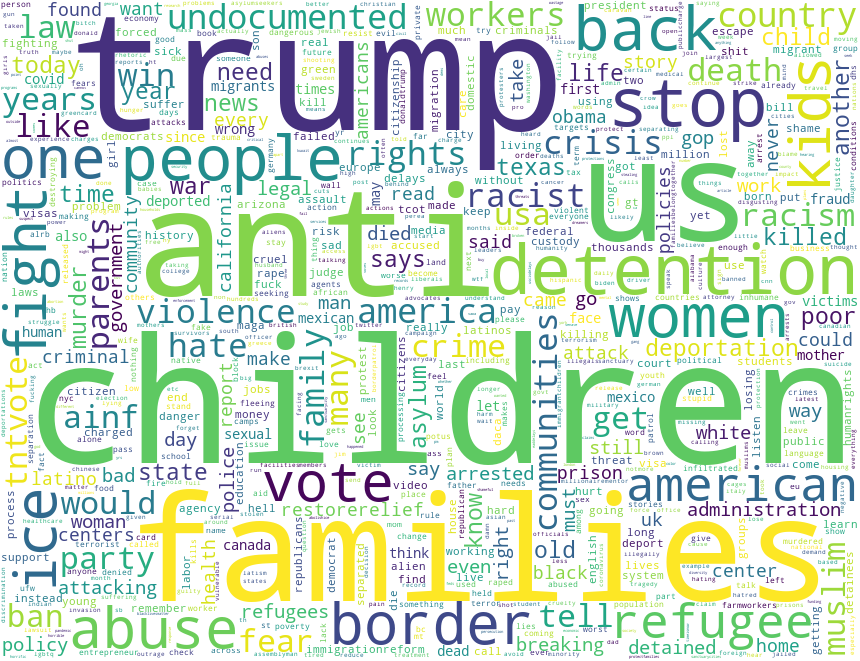

In [ ]:
create_wordcloud(dict_negative_tweets, "/content/drive/MyDrive/wc_negative.png")

# NetWork Analysis

## Data Preparation

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px
from sklearn.decomposition import PCA

In [ ]:
from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from sklearn.base import BaseEstimator
from sklearn import utils as skl_utils

import multiprocessing
import numpy as np

class Doc2VecTransformer(BaseEstimator):

    def __init__(self, vector_size=2, learning_rate=0.02, epochs=20):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self._model = None
        self.vector_size = vector_size
        self.workers = multiprocessing.cpu_count() - 1

    def fit(self, df_x, df_y=None):
        tagged_x = [TaggedDocument(row.split(), [index]) for index, row in enumerate(df_x)]
        model = Doc2Vec(documents=tagged_x, vector_size=self.vector_size, workers=self.workers)

        for epoch in range(self.epochs):
            model.train(skl_utils.shuffle([x for x in tqdm(tagged_x)]), total_examples=len(tagged_x), epochs=1)
            model.alpha -= self.learning_rate
            model.min_alpha = model.alpha

        self._model = model
        return self

    def transform(self, df_x):
        return np.asmatrix(np.array([self._model.infer_vector(row.split())
                                     for index, row in enumerate(df_x)]))

In [ ]:
doc2vec_trf = Doc2VecTransformer()
doc2vec_train_features = doc2vec_trf.fit(actual_tweets_df["Clean_text"]).transform(actual_tweets_df["Clean_text"])

In [ ]:
doc2vec_trf._model.save("/content/drive/MyDrive/tweets_d2v.model")

In [ ]:
# doc2vec_trf = Doc2VecTransformer()
# doc2vec_trf._model= Doc2Vec.load("/content/drive/MyDrive/tweets_d2v.model")

In [ ]:
doc2vec_train_features = doc2vec_trf.transform(actual_tweets_df["Clean_text"])

In [ ]:
doc2vec_train_features.shape

(195056, 2)

In [ ]:
doc2vec_train_features_df = pd.DataFrame(doc2vec_train_features, columns=["doc_vector_1", "doc_vector_2"])

In [ ]:
doc2vec_train_features_df

,doc_vector_1,doc_vector_2
0,0.089155,0.073643
1,-0.208810,-0.220368
2,0.183553,-0.207850
3,0.153259,-0.198305
4,0.051949,-0.116252
...,...,...
195051,0.115573,-0.067247
195052,-0.005263,-0.002310
195053,0.134818,-0.207716
195054,0.050851,-0.113706


In [ ]:
doc2vec_train_features_df["sentiment_score"] = actual_tweets_df["Sentiment_score"].values

In [ ]:
doc2vec_train_features_df

,doc_vector_1,doc_vector_2,sentiment_score
0,0.089155,0.073643,0.3094
1,-0.208810,-0.220368,-0.2732
2,0.183553,-0.207850,-0.0644
3,0.153259,-0.198305,-0.2023
4,0.051949,-0.116252,0.7840
...,...,...,...
195051,0.115573,-0.067247,0.0000
195052,-0.005263,-0.002310,0.0000
195053,0.134818,-0.207716,0.0000
195054,0.050851,-0.113706,0.0000


In [ ]:
doc2vec_train_features_df["username"] = actual_tweets_df["Username"].values

In [ ]:
doc2vec_train_features_df["sentiment"] = actual_tweets_df["Sentiment"].values

In [ ]:
tweet_user_df = doc2vec_train_features_df.drop_duplicates("username")
tweet_user_df

,doc_vector_1,doc_vector_2,sentiment_score,username,sentiment
0,0.089155,0.073643,0.3094,chesterwriter,1
1,-0.208810,-0.220368,-0.2732,author2authors,-1
2,0.183553,-0.207850,-0.0644,RayRedd1ngt0n,-1
3,0.153259,-0.198305,-0.2023,beckbeat,-1
4,0.051949,-0.116252,0.7840,MrAlvarezTeachr,2
...,...,...,...,...,...
195039,0.066856,0.128629,-0.6093,fastforfamilies,-2
195044,0.594351,-5.960114,0.5423,nationalmecha,1
195045,-0.143999,0.105617,-0.5423,vanessaquedas,-1
195054,0.050851,-0.113706,0.0000,Doeboy_BL,0


## Scatter Plots Using Sentiments

In [ ]:
fig = px.scatter(tweet_user_df, x="doc_vector_2", y="sentiment_score", color="sentiment", hover_data=['username'])
fig.show()

In [ ]:
fig = px.scatter_3d(
    tweet_user_df, x="doc_vector_1", y="doc_vector_2", z="sentiment_score",
    color="sentiment", labels={'color': 'sentiment'},  hover_data=['username']
)

fig.show()

## Installation

In [ ]:
!apt install libgraphviz-dev
!pip install pygraphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk libxdot4
0 upgraded, 8 newly installed, 0 to remove and 4 not upgraded.
Need to get 2,120 kB of archives.
After this operation, 7,128 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libgtk2.0-common all 2.24.32-1ubuntu1 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 libgtk2.0-0 amd64 2.24.32-1ubuntu1 [1,769 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/main 

## Creating Network of Twitter Users

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout
import pygraphviz

In [ ]:
tweet_user_df = tweet_user_df.sort_values('sentiment_score', ascending=False)

In [ ]:
tweet_user_df

,doc_vector_1,doc_vector_2,sentiment_score,username,sentiment
11065,-0.090057,0.148977,0.9870,aseeldib,2
36881,-0.019937,0.136270,0.9864,RallyPointBlue,2
1771,-0.216711,-0.163328,0.9826,PurviPoets,2
33772,-0.244109,-0.206783,0.9816,snowmom1953,2
62533,-0.227920,-0.038572,0.9808,barriobites,2
...,...,...,...,...,...
14741,-0.207949,0.083156,-0.9787,ky_williams2,-2
13684,-0.073236,0.103769,-0.9808,kae_crede,-2
58482,0.081985,0.215937,-0.9859,ClaytonCBoggs,-2
49838,0.142512,0.087937,-0.9860,NetDep911,-2


In [ ]:
tweet_user_df['tweets'] = actual_tweets_df.groupby('Username')['Username'].transform('count')

In [ ]:
tweet_user_df.describe()

,doc_vector_1,doc_vector_2,sentiment_score,sentiment,tweets
count,71413.000000,71413.000000,71413.000000,71413.000000,71413.000000
mean,0.009677,-0.051509,0.104832,0.226233,2.731379
std,0.337790,0.759434,0.449634,1.154961,15.756441
min,-17.987352,-30.979483,-0.993900,-2.000000,1.000000
25%,-0.124509,-0.127726,0.000000,0.000000,1.000000
50%,0.003339,-0.002073,0.000000,0.000000,1.000000
75%,0.126472,0.124677,0.458800,1.000000,2.000000
max,22.066177,10.863009,0.987000,2.000000,1330.000000


In [ ]:
users_positive_sentiment_df = tweet_user_df[tweet_user_df["sentiment_score"] > 0.50].sort_values("tweets", ascending=False)
users_negative_sentiment_df = tweet_user_df[tweet_user_df["sentiment_score"] < -0.50].sort_values("tweets", ascending=False)

In [ ]:
users_positive_sentiment = users_positive_sentiment_df["username"][:50].values
users_negative_sentiment = users_negative_sentiment_df["username"][:50].values

### Add Nodes

In [ ]:
G_users = nx.Graph()
plt.rcParams["figure.figsize"] = [20, 10]
plt.rcParams["figure.autolayout"] = True

In [ ]:
G_users.add_node("Total Tweets", weight= len(actual_tweets_df['Username'])/10, color = '#66ffff')
G_users.add_node("Positive Tweets", weight= len(actual_tweets_df[actual_tweets_df['Sentiment_score'] > 0.2])/10, color = '#66ff99')
G_users.add_node("Negative Tweets", weight= len(actual_tweets_df[actual_tweets_df['Sentiment_score'] < 0])/10, color = '#ff9966')

In [ ]:
# add the positive sentiment users
for i in range(50):
  G_users.add_node(users_positive_sentiment_df["username"].iloc[i], weight= users_positive_sentiment_df["tweets"].iloc[i], color = '#339966')
# add the negative sentiment users
for i in range(50):
  G_users.add_node(users_negative_sentiment_df["username"].iloc[i], weight= users_negative_sentiment_df["tweets"].iloc[i], color = '#bf4040')

In [ ]:
node_size = [value for key, value in dict(G_users.nodes.data("weight")).items()]

In [ ]:
node_color = [value for key, value in dict(G_users.nodes.data("color")).items()]

In [ ]:
G_users.nodes(data = True)

NodeDataView({'Total Tweets': {'weight': 19505.6, 'color': '#66ffff'}, 'Positive Tweets': {'weight': 7728.1, 'color': '#66ff99'}, 'Negative Tweets': {'weight': 4875.8, 'color': '#ff9966'}, 'ilctr': {'weight': 1330, 'color': '#339966'}, 'AskAngy': {'weight': 1320, 'color': '#339966'}, 'BiznessBoom': {'weight': 1030, 'color': '#339966'}, 'MattMalisiewicz': {'weight': 581, 'color': '#339966'}, 'FWDus': {'weight': 438, 'color': '#339966'}, 'Ausgewandert': {'weight': 358, 'color': '#339966'}, 'Immpreneur': {'weight': 305, 'color': '#339966'}, 'TRIEC': {'weight': 305, 'color': '#339966'}, 'GlobalDET': {'weight': 297, 'color': '#339966'}, 'lekwilliams': {'weight': 279, 'color': '#339966'}, 'TheDevinaKaur': {'weight': 265, 'color': '#339966'}, 'attamoves': {'weight': 248, 'color': '#339966'}, 'Vilcek': {'weight': 248, 'color': '#339966'}, 'TIESyyc': {'weight': 240, 'color': '#339966'}, 'WESGlobalTalent': {'weight': 231, 'color': '#339966'}, 'beaforeigner': {'weight': 216, 'color': '#339966'}, 

### Add Edges

In [ ]:
G_users.add_edge('Total Tweets', 'Positive Tweets')
G_users.add_edge('Total Tweets', 'Negative Tweets')

# add the edges to the positive sentiment users
for i in range(50):
  G_users.add_edge('Positive Tweets', users_positive_sentiment_df["username"].iloc[i])
# add the edges to the negative sentiment users
for i in range(50):
  G_users.add_edge('Negative Tweets', users_negative_sentiment_df["username"].iloc[i])

In [ ]:
G_users.edges()

EdgeView([('Total Tweets', 'Positive Tweets'), ('Total Tweets', 'Negative Tweets'), ('Positive Tweets', 'ilctr'), ('Positive Tweets', 'AskAngy'), ('Positive Tweets', 'BiznessBoom'), ('Positive Tweets', 'MattMalisiewicz'), ('Positive Tweets', 'FWDus'), ('Positive Tweets', 'Ausgewandert'), ('Positive Tweets', 'Immpreneur'), ('Positive Tweets', 'TRIEC'), ('Positive Tweets', 'GlobalDET'), ('Positive Tweets', 'lekwilliams'), ('Positive Tweets', 'TheDevinaKaur'), ('Positive Tweets', 'attamoves'), ('Positive Tweets', 'Vilcek'), ('Positive Tweets', 'TIESyyc'), ('Positive Tweets', 'WESGlobalTalent'), ('Positive Tweets', 'beaforeigner'), ('Positive Tweets', 'theYoungCenter'), ('Positive Tweets', 'ninarobertsnyc'), ('Positive Tweets', 'stilt_inc'), ('Positive Tweets', 'SuperImmigrant_'), ('Positive Tweets', 'dreamthemovie'), ('Positive Tweets', 'IEC_BC'), ('Positive Tweets', 'ratnaomi'), ('Positive Tweets', 'WENetworkGlobal'), ('Positive Tweets', 'TheikeSteele'), ('Positive Tweets', 'anamfores'),

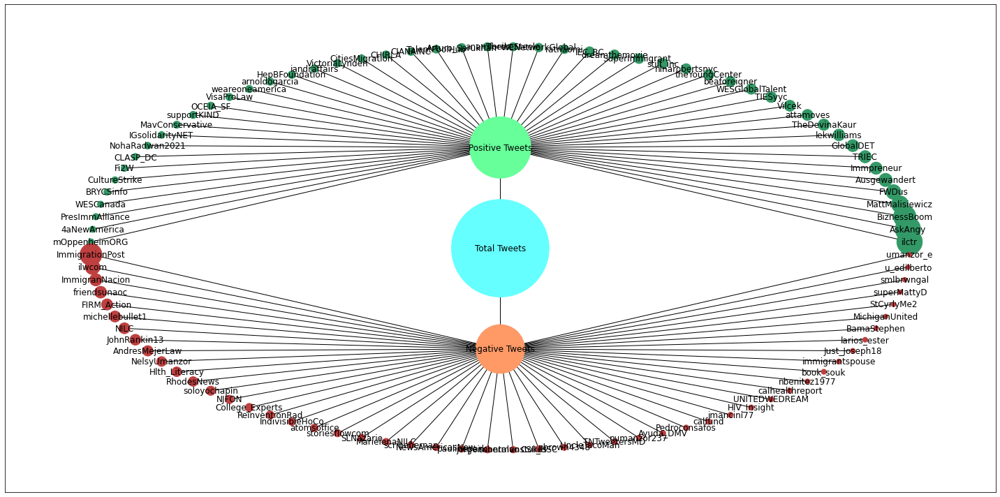

In [ ]:
pos = nx.nx_agraph.graphviz_layout(G_users, prog='twopi')
nx.draw_networkx(G_users, pos, with_labels = True, node_size=node_size, node_color = node_color)
plt.show()

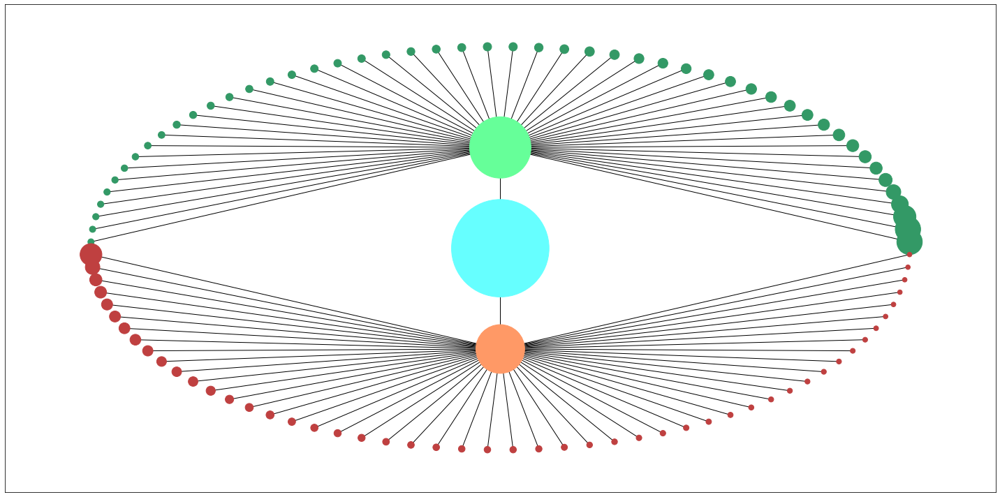

In [ ]:
pos = nx.nx_agraph.graphviz_layout(G_users, prog='twopi')
nx.draw_networkx(G_users, pos, with_labels = False, node_size=node_size, node_color = node_color)
plt.show()

## Creating Network of Prominent Words

In [ ]:
from functools import reduce
all_dict_words = reduce(lambda x, y: x.union(y.keys()), [dict_positive_tweets,dict_negative_tweets], set())

In [ ]:
dict_positive_unique_tweets = {}
dict_negative_unique_tweets = {}
for k in all_dict_words:
  if (k in dict_positive_tweets.keys()) and (k in dict_negative_tweets.keys()):
    if dict_positive_tweets[k] > dict_negative_tweets[k]:
      dict_positive_unique_tweets.update({k : dict_positive_tweets[k]})
    else:
      dict_negative_unique_tweets.update({k : dict_negative_tweets[k]})
  elif k in dict_positive_tweets.keys():
    dict_positive_unique_tweets.update({k : dict_positive_tweets[k]})
  else:
    dict_negative_unique_tweets.update({k : dict_negative_tweets[k]})

In [ ]:
dict_positive_unique_tweets = dict(sorted(dict_positive_unique_tweets.items(), key=lambda item: item[1], reverse = True))
dict_negative_unique_tweets = dict(sorted(dict_negative_unique_tweets.items(), key=lambda item: item[1], reverse = True))

### Add Nodes

In [ ]:
G_words = None
G_words = nx.Graph()
plt.rcParams["figure.figsize"] = [20, 10]
plt.rcParams["figure.autolayout"] = True

In [ ]:
G_words.add_node("Total Tweets", weight= len(actual_tweets_df['Username'])/10, color = '#66ffff')
G_words.add_node("Positive Tweets", weight= len(actual_tweets_df[actual_tweets_df['Sentiment_score'] > 0.2])/10, color = '#66ff99')
G_words.add_node("Negative Tweets", weight= len(actual_tweets_df[actual_tweets_df['Sentiment_score'] < 0])/10, color = '#ff9966')

In [ ]:
# add the positive sentiment words
for i in dict_positive_unique_tweets:
  G_words.add_node(i, weight= dict_positive_unique_tweets[i], color = '#339966')
# add the negative sentiment words
for i in dict_negative_unique_tweets:
  G_words.add_node(i, weight= dict_negative_unique_tweets[i], color = '#bf4040')

In [ ]:
node_size = [value for key, value in dict(G_words.nodes.data("weight")).items()]

In [ ]:
node_color = [value for key, value in dict(G_words.nodes.data("color")).items()]

In [ ]:
G_words.nodes(data = True)

NodeDataView({'Total Tweets': {'weight': 19505.6, 'color': '#66ffff'}, 'Positive Tweets': {'weight': 7728.1, 'color': '#66ff99'}, 'Negative Tweets': {'weight': 4875.8, 'color': '#ff9966'}, 'support': {'weight': 2781, 'color': '#339966'}, 'refugee': {'weight': 2536, 'color': '#339966'}, 'story': {'weight': 2449, 'color': '#339966'}, 'love': {'weight': 2379, 'color': '#339966'}, 'like': {'weight': 2359, 'color': '#339966'}, 'better': {'weight': 2160, 'color': '#339966'}, 'community': {'weight': 2094, 'color': '#339966'}, 'entrepreneur': {'weight': 2089, 'color': '#339966'}, 'families': {'weight': 2081, 'color': '#339966'}, 'america': {'weight': 2072, 'color': '#339966'}, 'business': {'weight': 2017, 'color': '#339966'}, 'join': {'weight': 1994, 'color': '#339966'}, 'today': {'weight': 1974, 'color': '#339966'}, 'work': {'weight': 1887, 'color': '#339966'}, 'thank': {'weight': 1844, 'color': '#339966'}, 'world': {'weight': 1835, 'color': '#339966'}, 'hope': {'weight': 1822, 'color': '#339

### Add Edges

In [ ]:
G_words.add_edge('Total Tweets', 'Positive Tweets')
G_words.add_edge('Total Tweets', 'Negative Tweets')

# add the edges to the positive sentiment users
for i in dict_positive_unique_tweets:
  G_words.add_edge('Positive Tweets', i)
# add the edges to the negative sentiment users
for i in dict_negative_unique_tweets:
  G_words.add_edge('Negative Tweets', i)

In [ ]:
G_words.edges()

EdgeView([('Total Tweets', 'Positive Tweets'), ('Total Tweets', 'Negative Tweets'), ('Positive Tweets', 'support'), ('Positive Tweets', 'refugee'), ('Positive Tweets', 'story'), ('Positive Tweets', 'love'), ('Positive Tweets', 'like'), ('Positive Tweets', 'better'), ('Positive Tweets', 'community'), ('Positive Tweets', 'entrepreneur'), ('Positive Tweets', 'families'), ('Positive Tweets', 'america'), ('Positive Tweets', 'business'), ('Positive Tweets', 'join'), ('Positive Tweets', 'today'), ('Positive Tweets', 'work'), ('Positive Tweets', 'thank'), ('Positive Tweets', 'world'), ('Positive Tweets', 'hope'), ('Positive Tweets', 'communities'), ('Positive Tweets', 'free'), ('Positive Tweets', 'success'), ('Positive Tweets', 'one'), ('Positive Tweets', 'american'), ('Positive Tweets', 'canada'), ('Positive Tweets', 'women'), ('Positive Tweets', 'please'), ('Positive Tweets', 'family'), ('Positive Tweets', 'proud'), ('Positive Tweets', 'country'), ('Positive Tweets', 'build'), ('Positive Twe

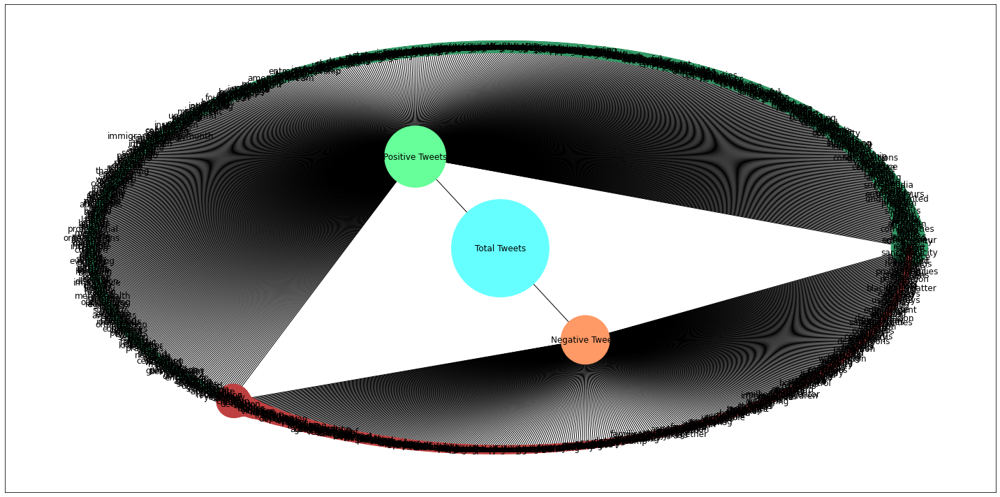

In [ ]:
pos = nx.nx_agraph.graphviz_layout(G_words, prog='twopi')
nx.draw_networkx(G_words, pos, with_labels = True, node_size=node_size, node_color = node_color)
plt.show()

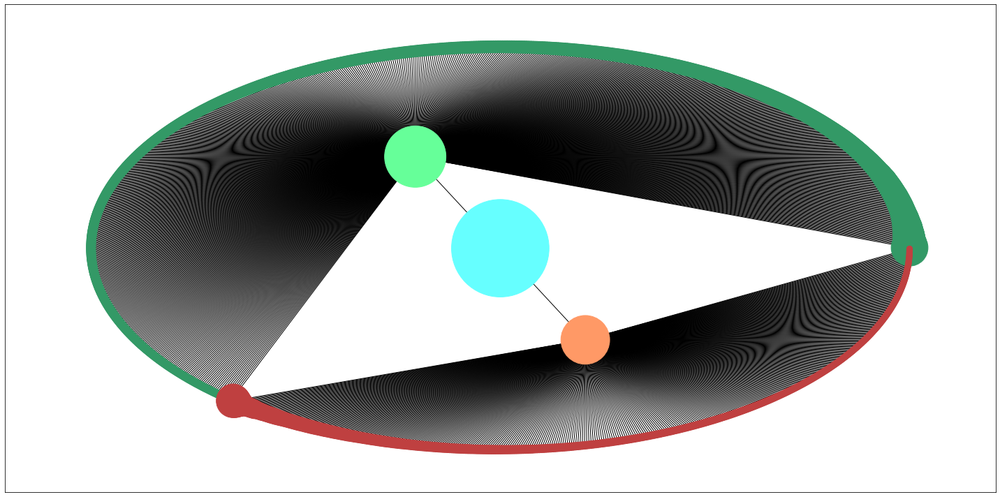

In [ ]:
pos = nx.nx_agraph.graphviz_layout(G_words, prog='twopi')
nx.draw_networkx(G_words, pos, with_labels = False, node_size=node_size, node_color = node_color)
plt.show()

# Saving the Data

In [ ]:
train_df.to_csv('tweets_actual_triaining.csv')
test_df.to_csv('tweets_actual_testing.csv')

In [ ]:
actual_tweets_df.to_csv('tweets_actual.csv')

In [ ]:
classification_tweets_df.to_csv('tweets_classification.csv')

In [ ]:
word_counts_df.to_csv('tweets_word_counts.csv')

In [ ]:
users_positive_sentiment_df.to_csv('tweets_users_with_positive_sentiment.csv')

In [ ]:
users_negative_sentiment_df.to_csv('tweets_users_with_positive_sentiment.csv')